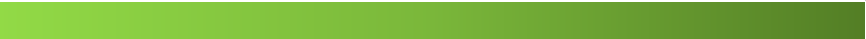

---



---
                              Projet : Segmentation et Prétraitement d’Images Médicales et Agricoles

---



---



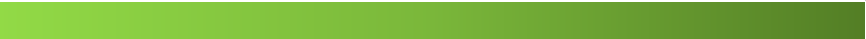



---



---



---



---



# **Medical :** Sclérose en plaques (SEP)
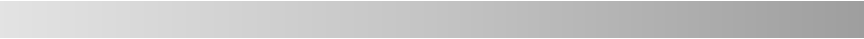







---

La sclérose en plaques (SEP) est une maladie auto-immune neurologique chronique et souvent invalidante qui affecte le système nerveux central et cause un dysfonctionnement du système immunitaire en lui entrainant des lésions qui provoquent des perturbations motrices, sensitives, cognitives ou encore visuelles. Cette notebook explore la segmentation des lésions de la SEP à travers des techniques avancées de prétraitement d'images. En utilisant des méthodes computationnelles, l'objectif est d'améliorer l'efficacité et la précision de l'identification des lésions dans les images médicales.

![SEP](https://i.f1g.fr/media/figaro/620x417/2015/07/12/INF221e5ef4-1f11-11e5-8549-06c039f83d88-620x417.jpg)

---

dans ce notebook nous aborderons diverses méthodes de prétraitement, telles que la normalisation d'image, la réduction de bruit et l'extraction de caractéristiques. Ces étapes sont essentielles pour optimiser les données d'entrée, permettant aux algorithmes de segmentation d'extraire des informations significatives.

![SEP](https://www.cen-neurologie.fr/sites/www.cen-neurologie.fr/files/files/capture_decran_2021-12-14_a_15.29.42.png)

La segmentation précise des lésions revêt une importance cruciale pour la compréhension de la progression de la maladie, le développement de stratégies thérapeutiques ciblées et l'évaluation de l'efficacité des traitements. Cette notebook sert de guide complet pour les chercheurs, les cliniciens et les data scientists souhaitant explorer les mystères de la sclérose en plaques grâce à une analyse d'image avancée.

---

#Prétraitement des Images:
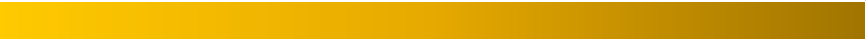



dans cette étape nous allons découvrir les données sur lesquelles on va travailler, on va afficher quelques échantillons des images de l'IRM des quelques patients pour pouvoir comprendre la structure des fichiers et ainsi savoir la méthodologie qu'on va adopter pour arriver à notre objectif

In [ ]:
data_link = "https://data.mendeley.com/datasets/8bctsm8jz7/1m"

## **Exploration des Données**

---




Extraction des fichiers à partir d'un document compressé 🧠

In [2]:
!unrar x '/content/drive/MyDrive/Colab Notebooks/Segmentation et Prétraitement d’Images Médicales et Agricoles/Brain MRI Dataset of Multiple Sclerosis with Consensus Manual Lesion Segmentation and Patient Meta Information.rar'

In [46]:
path = "/content/Brain MRI Dataset of Multiple Sclerosis with Consensus Manual Lesion Segmentation and Patient Meta Information/Patients Data/"

In [48]:
def Flair(n):
    Flair = nib.load(f'{path}Patient-{n}/{n}-Flair.nii').get_fdata()
    return Flair

def T1(n):
    T1 = nib.load(f'{path}Patient-{n}/{n}-T1.nii').get_fdata()
    return T1

def T2(n):
    T2 = nib.load(f'{path}Patient-{n}/{n}-T2.nii').get_fdata()
    return T2

def LesionSeg_Flair(n):
    LesionSeg_Flair = nib.load(f'{path}/Patient-{n}/{n}-LesionSeg-Flair.nii').get_fdata()
    return LesionSeg_Flair

def LesionSeg_T1(n):
    LesionSeg_T1 = nib.load(f'{path}Patient-{n}/{n}-LesionSeg-T1.nii').get_fdata()
    return LesionSeg_T1

def LesionSeg_T2(n):
    LesionSeg_T2 = nib.load(f'{path}Patient-{n}/{n}-LesionSeg-T2.nii').get_fdata()
    return LesionSeg_T2

In [49]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

In [50]:
def show_patient_brain(n,char):
  test_load = nib.load(f'/content/Brain MRI Dataset of Multiple Sclerosis with Consensus Manual Lesion Segmentation and Patient Meta Information/Patients Data/Patient-{n}/{n}-{char}.nii').get_fdata()

  num_images = test_load.shape[2]
  num_columns = 4
  num_rows = (num_images + num_columns - 1) // num_columns

  fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))

  for i in range(test_load.shape[2]):
      row = i // num_columns
      col = i % num_columns

      ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

      ax.imshow(test_load[:,:,i])
      ax.axis('off')
      ax.text(0.5, -0.1, f'{char} : Nº {i+1}', va='center', ha='center', transform=ax.transAxes)

  for i in range(num_images, num_rows * num_columns):
      row = i // num_columns
      col = i % num_columns
      axes[row, col].axis('off')

  plt.suptitle(f'Patient {n} - {char} Images',va='top', ha='center', fontsize=16)
  plt.tight_layout()
  plt.show()

Dans les fichier obtenus on distingue trois types de fichier, et chaque fichier contient l'ensemble des sequences du cerveau pour un patient donné 🧠
  - **FLAIR (Fluid Attenuated Inversion Recovery) :**
La séquence FLAIR est souvent utilisée dans l'imagerie de la sclérose en plaques pour mettre en évidence les lésions inflammatoires de la matière blanche du cerveau. En atténuant le signal du liquide cérébrospinal, elle permet une meilleure visualisation des lésions adjacentes au liquide, ce qui est particulièrement important dans le contexte de la sclérose en plaques.

  - **T1 (Temps de Répétition 1) :**
Les images T1 sont utilisées pour évaluer l'anatomie structurelle du cerveau dans le contexte de la sclérose en plaques. Elles peuvent aider à identifier les changements dans les tissus cérébraux, y compris les zones de démyélinisation ou d'autres altérations structurelles associées à la maladie.

  - **T2 (Temps de Répétition 2) :**
La séquence T2 est précieuse pour détecter les lésions liées à la sclérose en plaques, en mettant en évidence les changements dans la teneur en eau des tissus. Les lésions inflammatoires, typiques de la sclérose en plaques, sont souvent bien visualisées sur les images T2.

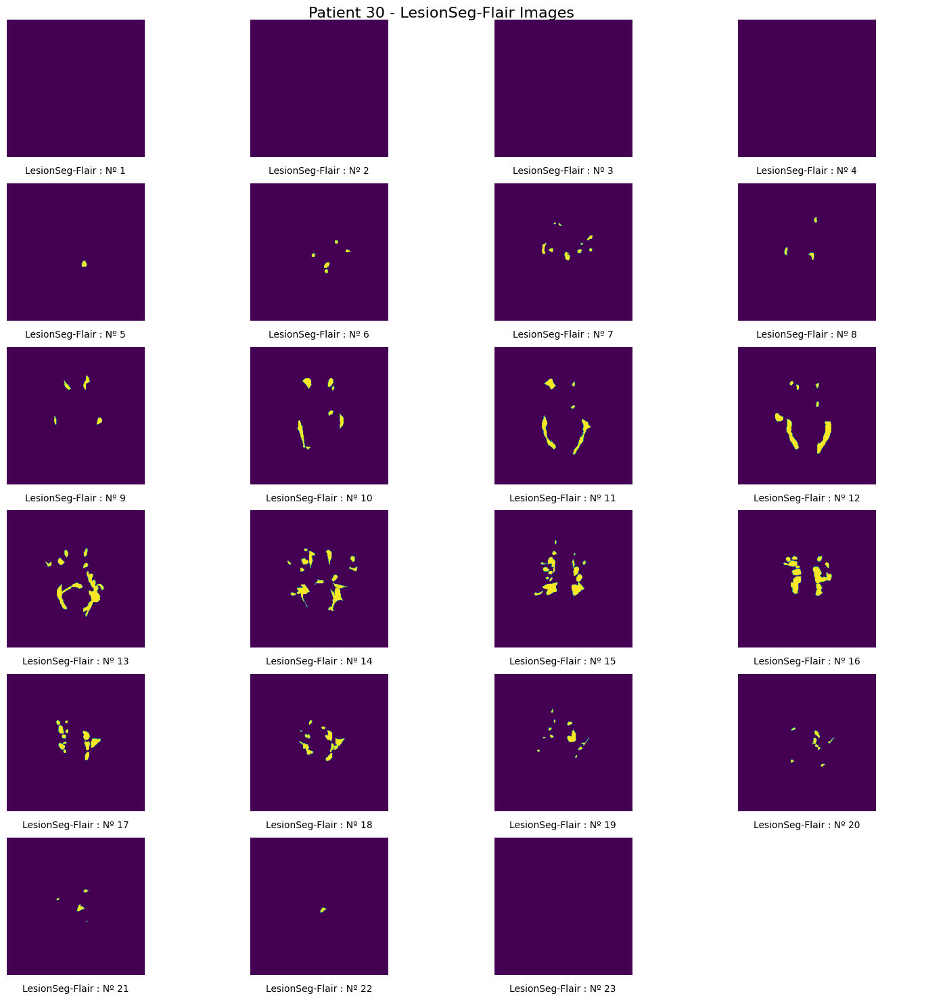

In [51]:
show_patient_brain(30,"LesionSeg-Flair")

Ces images sont obtenus grace à l'IRM et ils représentent les differentes section du cerveau lors du dignostique du patient et son installatin sur la table de la machine d'imagerie par résonance magnétique (IRM)

In [12]:
def show_patient_brain_sequences(patient_num,picture_num):
  load_Flair = nib.load(f'/content/Brain MRI Dataset of Multiple Sclerosis with Consensus Manual Lesion Segmentation and Patient Meta Information/Patients Data/Patient-{patient_num}/{patient_num}-Flair.nii').get_fdata()
  load_T1 = nib.load(f'/content/Brain MRI Dataset of Multiple Sclerosis with Consensus Manual Lesion Segmentation and Patient Meta Information/Patients Data/Patient-{patient_num}/{patient_num}-T1.nii').get_fdata()
  load_T2 = nib.load(f'/content/Brain MRI Dataset of Multiple Sclerosis with Consensus Manual Lesion Segmentation and Patient Meta Information/Patients Data/Patient-{patient_num}/{patient_num}-T2.nii').get_fdata()

  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  # Plot the first image
  axes[0].imshow(load_Flair[:,:,picture_num-1])
  axes[0].set_title('Flair sequence')
  axes[0].axis('off')

  # Plot the second image
  axes[1].imshow(load_T1[:,:,picture_num-1])
  axes[1].set_title('T1 sequence')
  axes[1].axis('off')

  # Plot the third image
  axes[2].imshow(load_T2[:,:,picture_num-1])
  axes[2].set_title('T2 sequence')
  axes[2].axis('off')

  plt.tight_layout()
  plt.show()

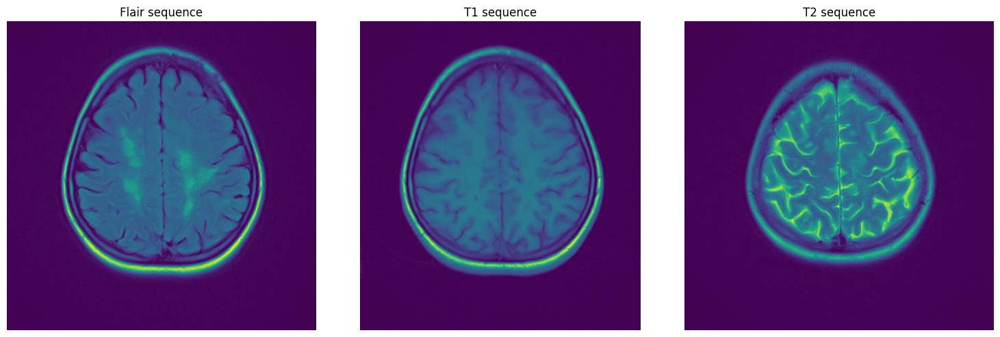

In [13]:
show_patient_brain_sequences(30,17)

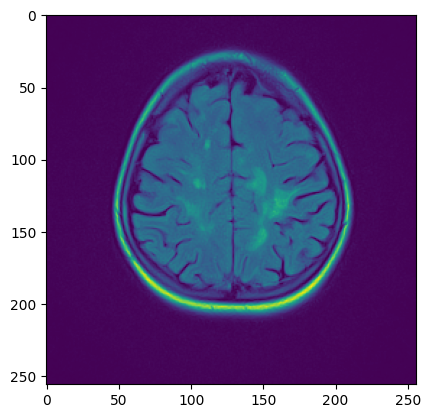

In [14]:
plt.imshow(Flair(30)[:,:,17])

## **Amélioration du contraste:**

---






* #### *Techniques d’étirement de l’histogramme*

---



---



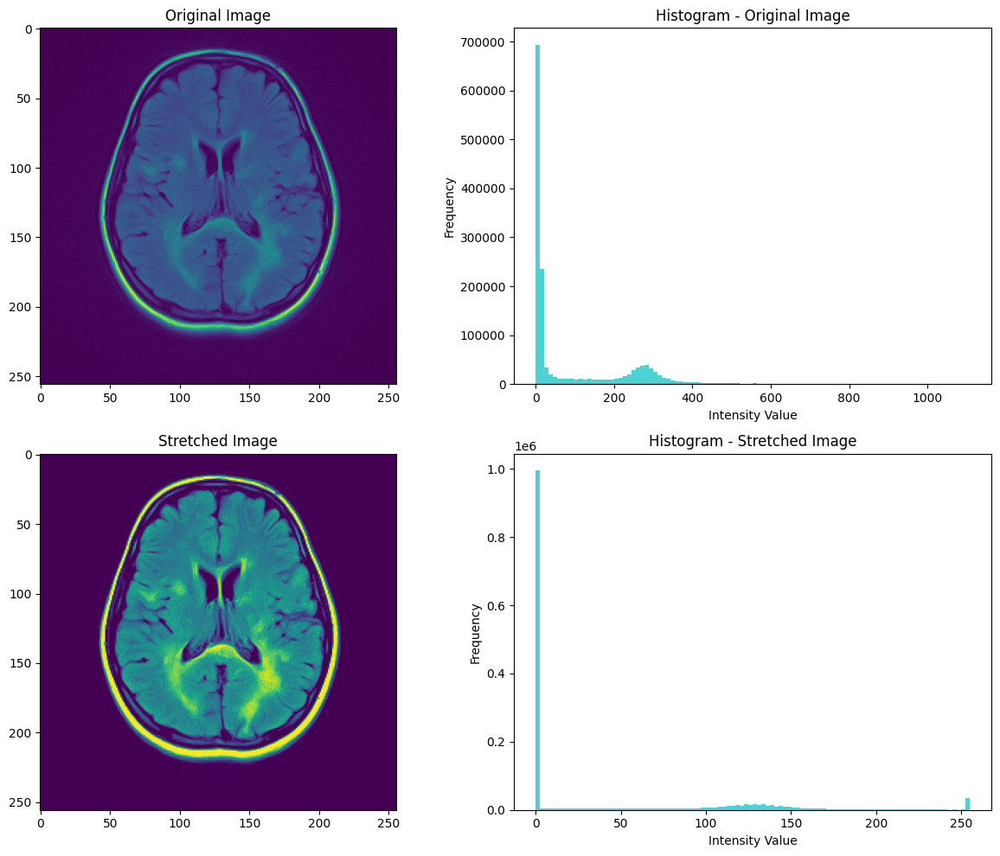

In [15]:
import cv2
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

def histogram_stretching(img):

  # Flatten the 3D image data to a 1D array
  flat_data = img.flatten()

  # Define the desired minimum and maximum intensity values after stretching
  min_intensity = 50
  max_intensity = 500

  # Perform histogram stretching
  stretched_data = np.clip((flat_data - min_intensity) * (255.0 / (max_intensity - min_intensity)), 0, 255)

  # Reshape the 1D array back to the original shape
  stretched_data_reshaped = stretched_data.reshape(img.shape)
  return stretched_data_reshaped

# Display the original and stretched images with histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Original image
axes[0, 0].imshow(Flair(30)[:, :, 12], cmap='viridis')
axes[0, 0].set_title('Original Image')

# Histogram for original image
axes[0, 1].hist(Flair(30).flatten(), bins=100, color='c', alpha=0.7)
axes[0, 1].set_title('Histogram - Original Image')
axes[0, 1].set_xlabel('Intensity Value')
axes[0, 1].set_ylabel('Frequency')

# Stretched image
axes[1, 0].imshow(histogram_stretching(Flair(30))[:, :, 12], cmap='viridis')
axes[1, 0].set_title('Stretched Image')

# Histogram for stretched image
axes[1, 1].hist(histogram_stretching(Flair(30)).flatten(), bins=100, color='c', alpha=0.7)
axes[1, 1].set_title('Histogram - Stretched Image')
axes[1, 1].set_xlabel('Intensity Value')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


* #### *Transformations logarithmiques et exponentielles*

---



---



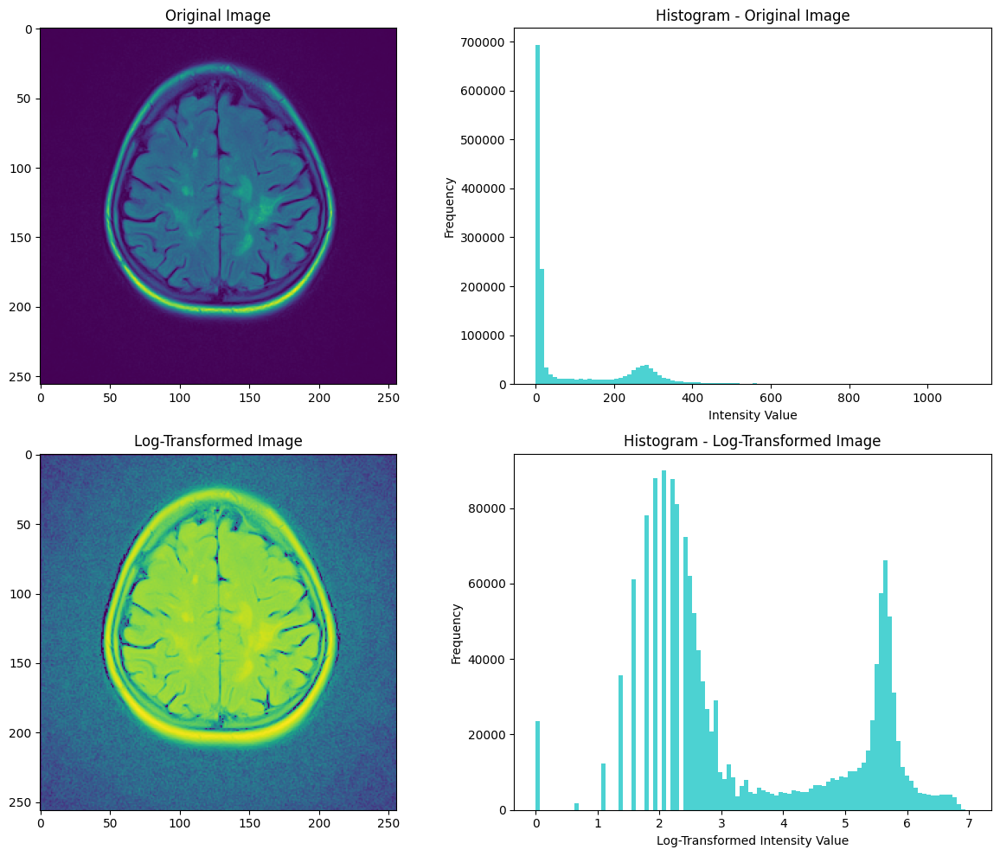

In [16]:
import cv2
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

img = Flair(30)

# Flatten the 3D image data to a 1D array
flat_data = img.flatten()

# Apply logarithmic transformation
log_transformed_data = np.log1p(flat_data)

# Reshape the 1D array back to the original shape
log_transformed_data_reshaped = log_transformed_data.reshape(img.shape)

# Display the original and log-transformed images with histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Original image
axes[0, 0].imshow(img[:, :, 17], cmap='viridis')
axes[0, 0].set_title('Original Image')

# Histogram for original image
axes[0, 1].hist(flat_data, bins=100, color='c', alpha=0.7)
axes[0, 1].set_title('Histogram - Original Image')
axes[0, 1].set_xlabel('Intensity Value')
axes[0, 1].set_ylabel('Frequency')

# Log-transformed image
axes[1, 0].imshow(log_transformed_data_reshaped[:, :, 17], cmap='viridis')
axes[1, 0].set_title('Log-Transformed Image')

# Histogram for log-transformed image
axes[1, 1].hist(log_transformed_data, bins=100, color='c', alpha=0.7)
axes[1, 1].set_title('Histogram - Log-Transformed Image')
axes[1, 1].set_xlabel('Log-Transformed Intensity Value')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

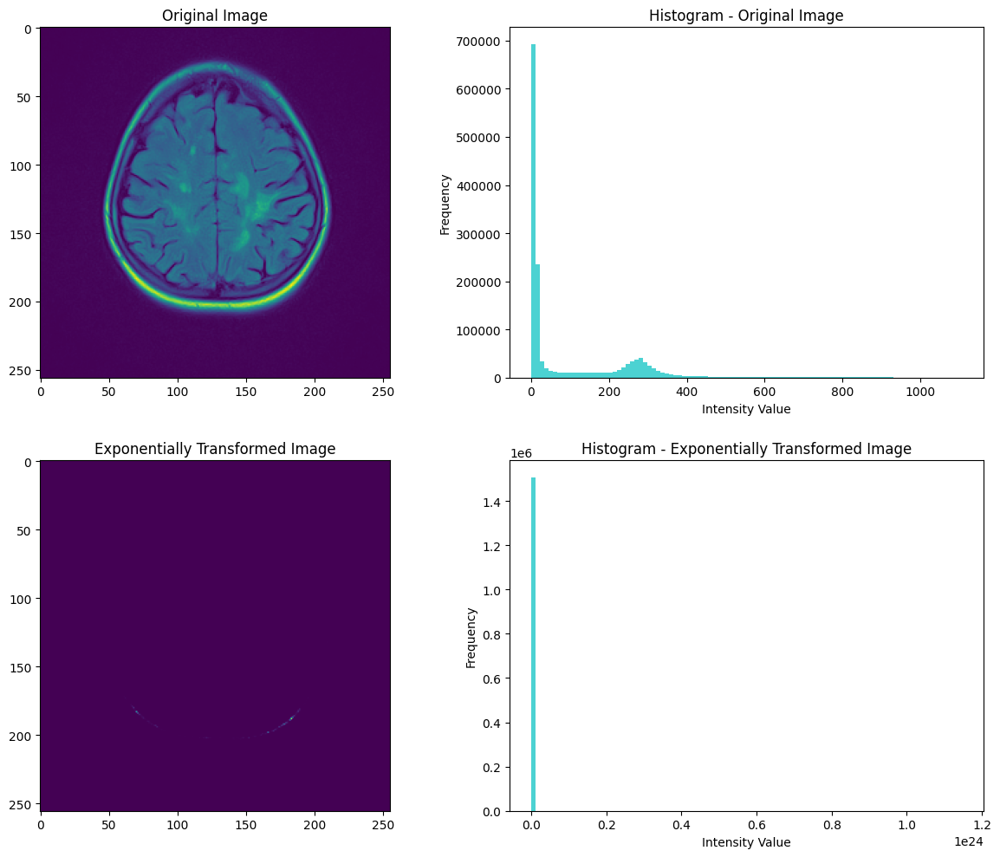

In [17]:
import cv2
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NIfTI image
img = Flair(30)

# Flatten the 3D image data to a 1D array
flat_data = img.flatten()

# Parameters for exponential transformation
alpha = 1.0  # You can experiment with different values
beta = 0.05  # You can experiment with different values

# Perform exponential transformation
exp_transformed_data = alpha * (np.exp(beta * flat_data) - 1)

# Reshape the 1D array back to the original shape
exp_transformed_data_reshaped = exp_transformed_data.reshape(img.shape)

# Display the original and exponentially transformed images with histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Original image
axes[0, 0].imshow(img[:, :, 17], cmap='viridis')
axes[0, 0].set_title('Original Image')

# Histogram for original image
axes[0, 1].hist(flat_data, bins=100, color='c', alpha=0.7)
axes[0, 1].set_title('Histogram - Original Image')
axes[0, 1].set_xlabel('Intensity Value')
axes[0, 1].set_ylabel('Frequency')

# Exponentially transformed image
axes[1, 0].imshow(exp_transformed_data_reshaped[:, :, 17], cmap='viridis')
axes[1, 0].set_title('Exponentially Transformed Image')

# Histogram for exponentially transformed image
axes[1, 1].hist(exp_transformed_data, bins=100, color='c', alpha=0.7)
axes[1, 1].set_title('Histogram - Exponentially Transformed Image')
axes[1, 1].set_xlabel('Intensity Value')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

## **Égalisation d’histogramme:**

---






* #### *Égalisation d’histogramme classique*

---



---



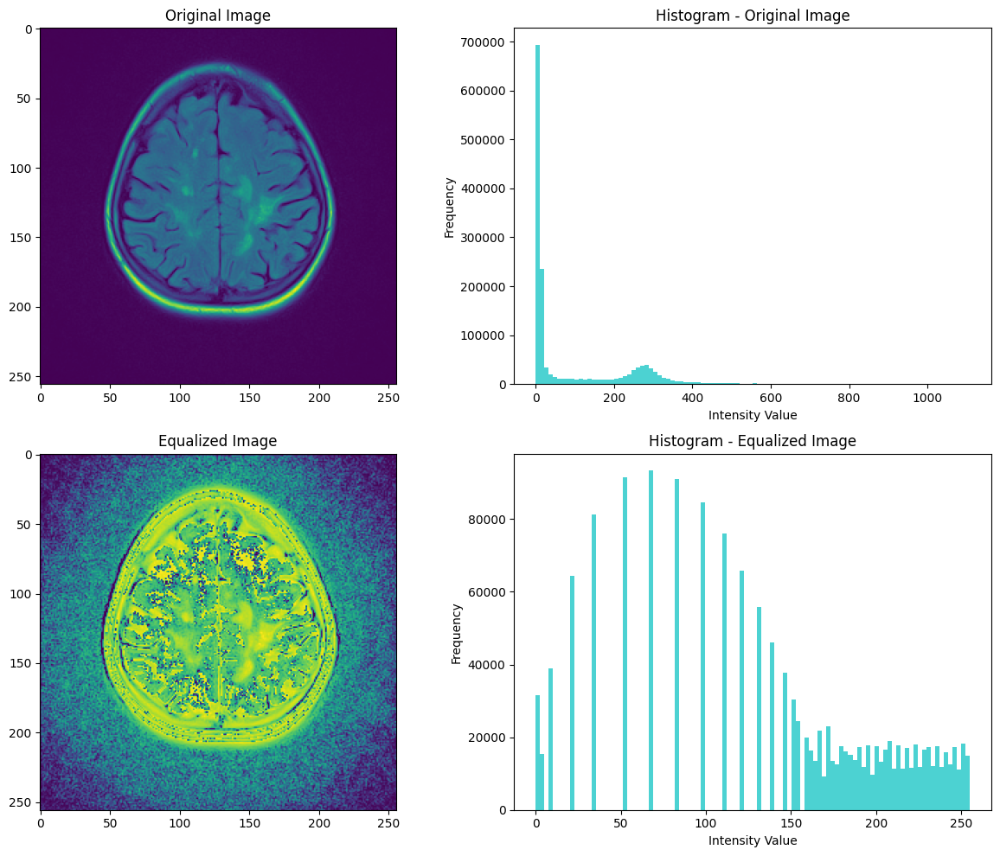

In [18]:
import cv2
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NIfTI image
img = Flair(30)

# Flatten the 3D image data to a 1D array
flat_data = img.flatten()

# Perform histogram equalization
equ_data = cv2.equalizeHist(flat_data.astype(np.uint8))

# Reshape the 1D array back to the original shape
equ_data_reshaped = equ_data.reshape(img.shape)

# Display the original and equalized images with histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Original image
axes[0, 0].imshow(img[:, :, 17], cmap='viridis')
axes[0, 0].set_title('Original Image')

# Histogram for original image
axes[0, 1].hist(flat_data, bins=100, color='c', alpha=0.7)
axes[0, 1].set_title('Histogram - Original Image')
axes[0, 1].set_xlabel('Intensity Value')
axes[0, 1].set_ylabel('Frequency')

# Equalized image
axes[1, 0].imshow(equ_data_reshaped[:, :, 17], cmap='viridis')
axes[1, 0].set_title('Equalized Image')

# Histogram for equalized image
axes[1, 1].hist(equ_data, bins=100, color='c', alpha=0.7)
axes[1, 1].set_title('Histogram - Equalized Image')
axes[1, 1].set_xlabel('Intensity Value')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

* #### *Égalisation adaptative*

---



---



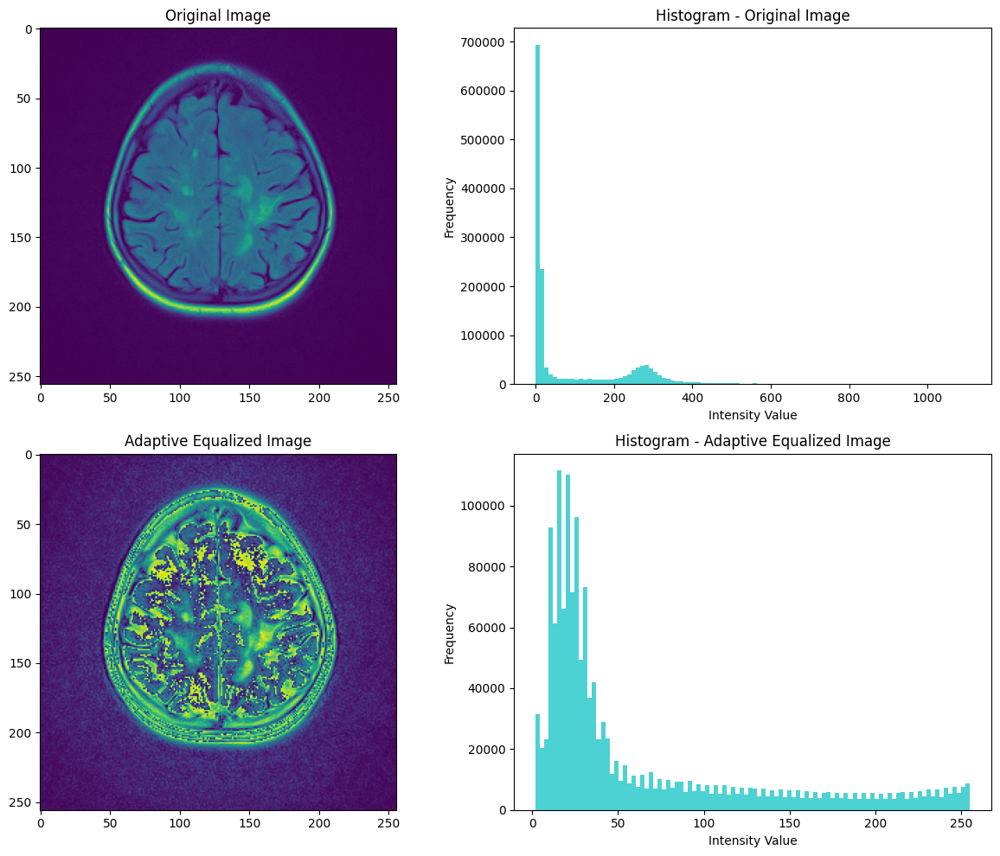

In [19]:
import cv2
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NIfTI image
img = Flair(30)

# Flatten the 3D image data to a 1D array
flat_data = img.flatten()

# Perform adaptive histogram equalization
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
equ_data = clahe.apply(flat_data.astype(np.uint8))

# Reshape the 1D array back to the original shape
equ_data_reshaped = equ_data.reshape(img.shape)

# Display the original and equalized images with histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Original image
axes[0, 0].imshow(img[:, :, 17], cmap='viridis')
axes[0, 0].set_title('Original Image')

# Histogram for original image
axes[0, 1].hist(flat_data, bins=100, color='c', alpha=0.7)
axes[0, 1].set_title('Histogram - Original Image')
axes[0, 1].set_xlabel('Intensity Value')
axes[0, 1].set_ylabel('Frequency')

# Equalized image
axes[1, 0].imshow(equ_data_reshaped[:, :, 17], cmap='viridis')
axes[1, 0].set_title('Adaptive Equalized Image')

# Histogram for equalized image
axes[1, 1].hist(equ_data, bins=100, color='c', alpha=0.7)
axes[1, 1].set_title('Histogram - Adaptive Equalized Image')
axes[1, 1].set_xlabel('Intensity Value')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

conclusion

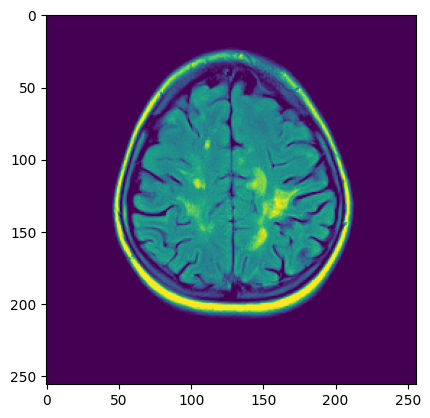

In [20]:
plt.imshow(histogram_stretching(Flair(30))[:, :, 17])

## **Élimination du bruit:**

---






* #### *Filtres spatiaux:*

---



---



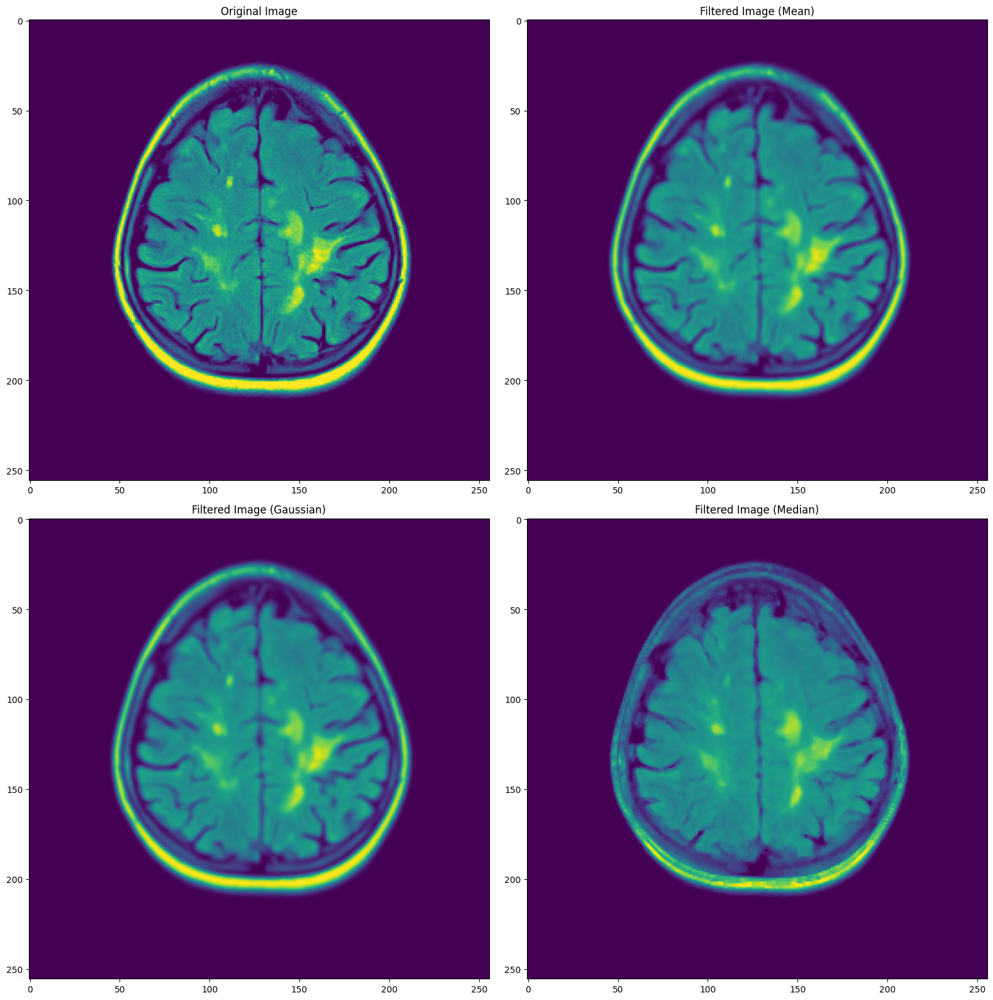

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter

# Get the image data
data = histogram_stretching(Flair(30))

# Apply a mean filter to the original image
kernel_size_mean = 3  # Adjust the kernel size as needed
filtered_image_mean = cv2.filter2D(data, -1, np.ones((kernel_size_mean, kernel_size_mean), np.float32)/(kernel_size_mean*kernel_size_mean))

# Apply a median filter to the original image
kernel_size_median = 3  # Adjust the kernel size as needed
filtered_image_median = median_filter(data, kernel_size_median)

# Apply a Gaussian filter to the original image
kernel_size_gaussian = (5, 5)  # Adjust the kernel size as needed
filtered_image_gaussian = cv2.GaussianBlur(data, kernel_size_gaussian, 0)

# Display the original and filtered images
fig, axes = plt.subplots(2, 2, figsize=(16, 16))

# Original image
axes[0,0].imshow(data[:, :, 17], cmap='viridis')
axes[0,0].set_title('Original Image')

# Filtered image mean
axes[0,1].imshow(filtered_image_mean[:, :, 17], cmap='viridis')
axes[0,1].set_title('Filtered Image (Mean)')

# Filtered image Gaussian
axes[1,0].imshow(filtered_image_gaussian[:, :, 17], cmap='viridis')
axes[1,0].set_title('Filtered Image (Gaussian)')

# Filtered image median
axes[1,1].imshow(filtered_image_median[:, :, 17], cmap='viridis')
axes[1,1].set_title('Filtered Image (Median)')



plt.tight_layout()
plt.show()


* #### *Techniques non-linéaires*

---



---



## **Analyse de l’histogramme:**

---






* #### *Étude des pics et des vallées:*

---



---



In [22]:
from scipy.stats import describe

import pandas as pd

def image_statistics(image):

    if image is None:

        raise Exception("Image is None")

    flat_image = image.flatten()

    stats = describe(flat_image)

    return {

        'Peaks': max(flat_image),

        'Valleys': min(flat_image),

        'Mean': stats.mean,

        'Std Deviation': stats.variance**0.5,

        'Skewness': stats.skewness,

        'Kurtosis': stats.kurtosis

    }
results_list=[]
# Initialiser une liste pour stocker les résultats
results_list.append(image_statistics(Flair(30)[:,:,17]))
results_list.append(image_statistics(histogram_stretching(Flair(30)[:,:,17])))

result_df = pd.DataFrame(results_list)

# Afficher le DataFrame

result_df

,Peaks,Valleys,Mean,Std Deviation,Skewness,Kurtosis
0,792.0,0.0,95.993561,135.028207,1.459949,1.638701
1,255.0,0.0,40.008754,64.351263,1.399612,0.877093


* #### *Modélisation statistique de l’histogramme*

---



---



* #### *Optimisation des seuils pour le contraste et la luminosité*

---



---



#Segmentation:
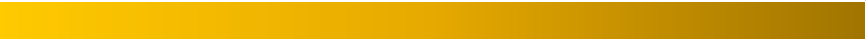



## **Segmentation basée sur l’intensité (Thresholding):**

---






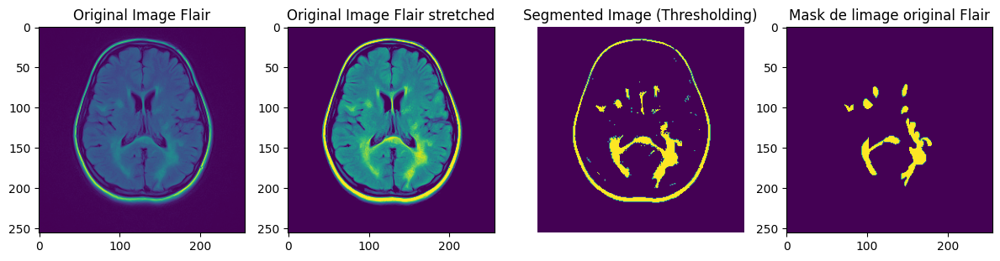

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def thresholding_seg(image):
  # Get the image data
  data = image

  # Flatten the 3D image data to a 1D array
  flat_data = data.flatten()

  # Define a threshold value for segmentation
  threshold_value = 160

  # Apply thresholding to create a binary mask
  binary_mask = (data > threshold_value).astype(np.uint8) * 255

  return binary_mask

# Display the original and segmented images with histograms
fig, axes = plt.subplots(1, 4, figsize=(12, 5))

# Display a middle slice along the third dimension of the original image
axes[0].imshow(Flair(30)[:, :, 12], cmap='viridis')
axes[0].set_title('Original Image Flair')

# Display a middle slice along the third dimension of the original image
axes[1].imshow(histogram_stretching(Flair(30))[:, :, 12], cmap='viridis')
axes[1].set_title('Original Image Flair stretched')

# Display the segmented image for the same slice
axes[2].imshow(thresholding_seg(histogram_stretching(Flair(30)))[:, :, 12], cmap='viridis')
axes[2].set_title('Segmented Image (Thresholding)')
axes[2].axis('off')


axes[3].imshow(LesionSeg_Flair(30)[:, :, 12], cmap='viridis')
axes[3].set_title('Mask de limage original Flair')

plt.tight_layout()
plt.show()

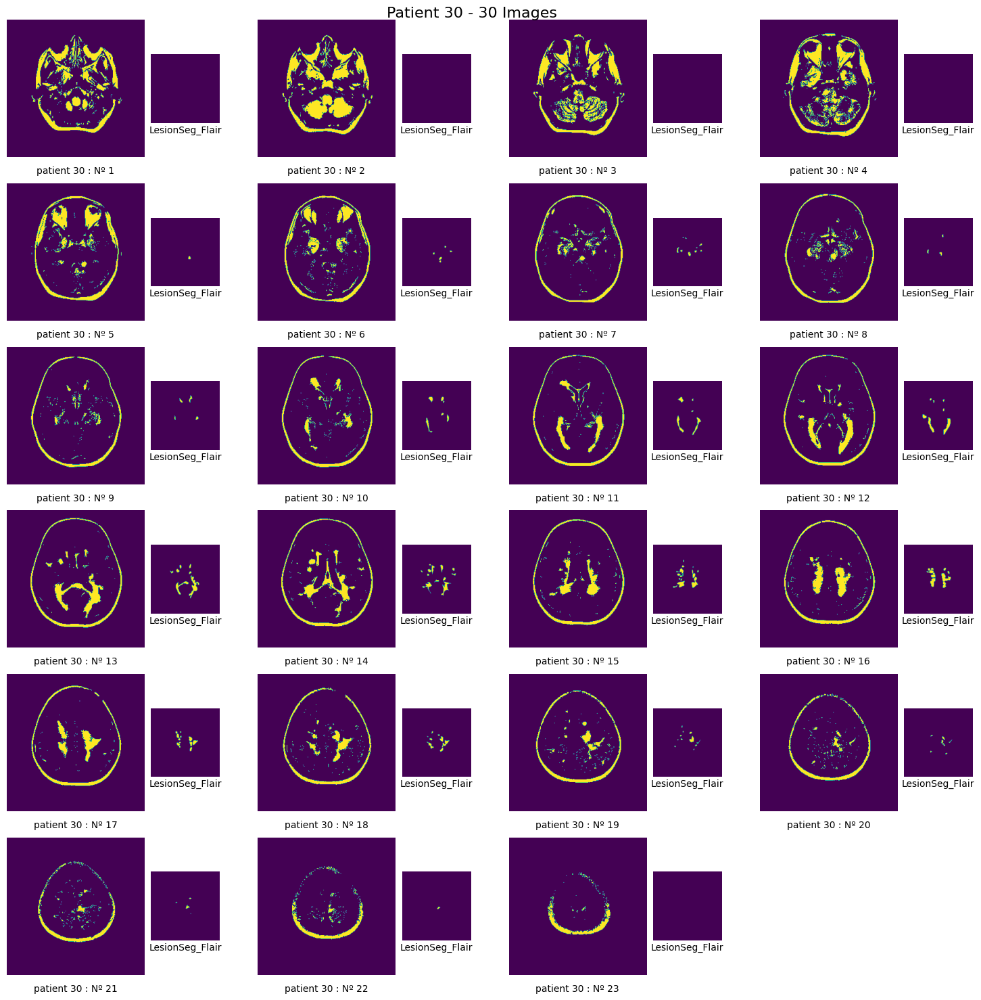

In [24]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

def compare_thresholding_to_mask(n, skip_first=0, n_clusters=3):
    test_load = histogram_stretching(Flair(n))

    num_images = test_load.shape[2]
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))
    global mon_mask1
    mon_mask1 = []

    for i in range(test_load.shape[2]):
        row = i // num_columns
        col = i % num_columns

        ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

        if i < skip_first:
            # Show white image with one pixel for skipped frames using a binary colormap
            ax.imshow(np.ones_like(thresholding_seg(test_load[:, :, 0], n_clusters)), cmap='viridis')
            mon_mask1.append(np.ones_like(test_load[:, :, 0]))
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

        else:

            a = thresholding_seg(histogram_stretching(Flair(n))[:, :, i])
            ax.imshow(a, cmap='viridis')
            mon_mask1.append(a)
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

    for i in range(num_images, num_rows * num_columns):
        row = i // num_columns
        col = i % num_columns
        axes[row, col].axis('off')

    plt.suptitle(f'Patient {n} - {n} Images', va='top', ha='center', fontsize=16)
    plt.tight_layout()
    plt.show()

compare_thresholding_to_mask(30)

In [25]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, jaccard_score, recall_score, precision_score

def calculate_metrics(segmented_image, true_mask):
    # Flatten the images to 1D arrays
    segmented_flat = segmented_image.flatten()
    true_flat = true_mask.flatten()

    # Calculate accuracy
    accuracy = accuracy_score(true_flat, segmented_flat)

    # Calculate Jaccard Index (IoU)
    jaccard_index = jaccard_score(true_flat, segmented_flat, average='weighted')

    # Calculate Dice Coefficient
    dice_coefficient = 2 * np.sum(np.logical_and(segmented_flat, true_flat)) / \
                       (np.sum(segmented_flat) + np.sum(true_flat))

    # Calculate recall (Sensibilité)
    recall = recall_score(true_flat, segmented_flat, average='weighted')

    # Calculate precision
    precision = precision_score(true_flat, segmented_flat, average='weighted')

    # Calculate specificity
    true_negative = np.sum(np.logical_and(true_flat == 0, segmented_flat == 0))
    false_positive = np.sum(np.logical_and(true_flat == 0, segmented_flat != 0))
    specificity = true_negative / (true_negative + false_positive)

    # Hausdorff Distance
    # You may need to implement or use a library for this metric, as it's not available in scikit-learn.
    # One option is to use the `scipy.spatial.distance.directed_hausdorff` function.

    # Create a dictionary to store the results
    metrics_dict = {
        'Accuracy': accuracy,
        'Jaccard Index': jaccard_index,
        'Dice Coefficient': dice_coefficient,
        'Sensibilité (Recall)': recall,
        'Précision': precision,
        'Spécificité': specificity,
        # 'Hausdorff Distance': hausdorff_distance,  # Uncomment and provide the actual value
    }

    return metrics_dict

# Example usage:
segmented_image = np.array(mon_mask1)
true_mask = np.array(LesionSeg_Flair(30))

metrics_result1 = calculate_metrics(segmented_image, true_mask)
pd.DataFrame([metrics_result1])

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Accuracy,Jaccard Index,Dice Coefficient,Sensibilité (Recall),Précision,Spécificité
0,0.928852,0.920364,0.000065,0.928852,0.980712,0.937898


## **Segmentation par Clustering:**

---






/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

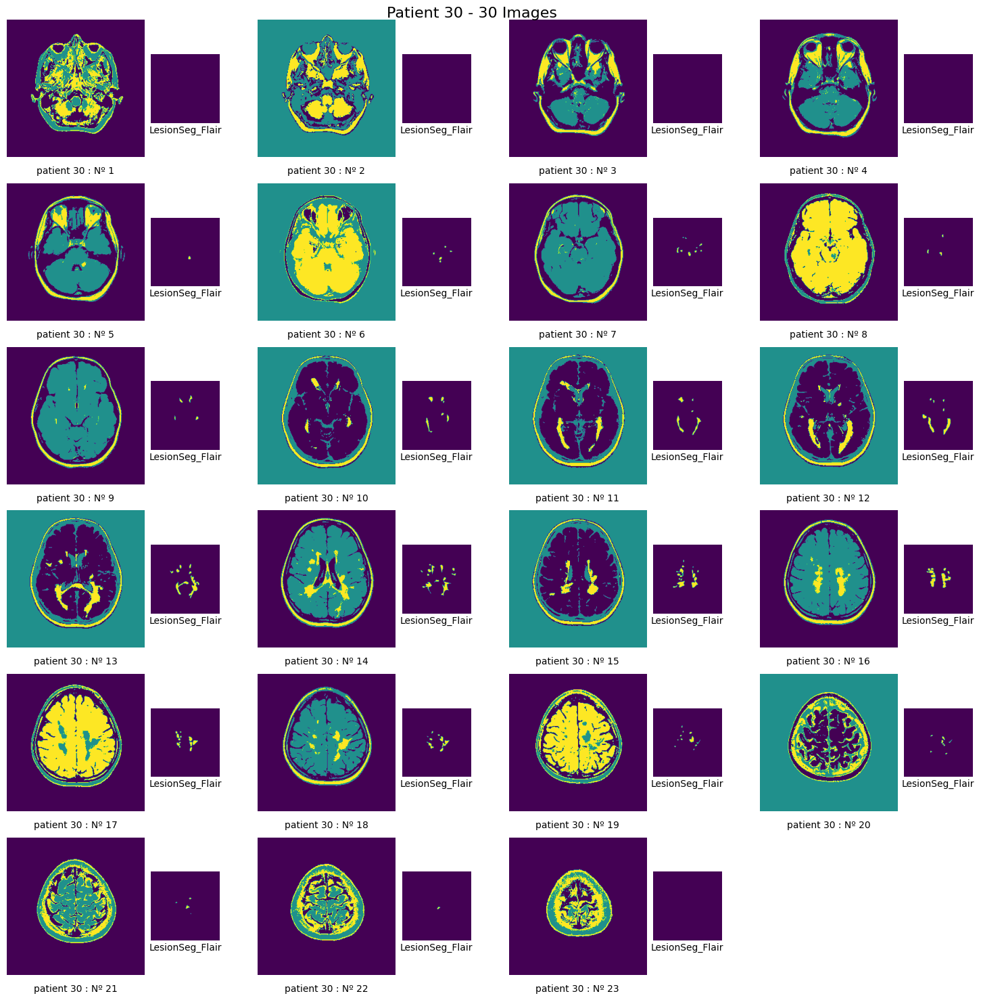

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from sklearn.cluster import KMeans
from skimage import color
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Function for K-means clustering segmentation
def kmeans_segmentation(image, n_clusters):
    # Convert the image to a flat 2D array
    data = image.reshape((-1, 1))

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(data)
    segmented_image = kmeans.labels_.reshape(image.shape)

    # Find the smallest cluster
    #smallest_cluster_label = np.argmin(np.bincount(kmeans.labels_))

    # Keep only the smallest cluster
    #smallest_cluster_mask = (segmented_image == smallest_cluster_label).astype(segmented_image.dtype)

    return segmented_image


# Function to compare clustering segmentation to mask
def compare_clustering_to_mask(n, skip_first=0, n_clusters=3):
    test_load = histogram_stretching(Flair(n))

    num_images = test_load.shape[2]
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))

    for i in range(test_load.shape[2]):
        row = i // num_columns
        col = i % num_columns

        ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

        if i < skip_first:
            # Show white image with one pixel for skipped frames using a binary colormap
            ax.imshow(np.ones_like(kmeans_segmentation(test_load[:, :, 0], n_clusters)), cmap='viridis')
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

        else:
            a = kmeans_segmentation(histogram_stretching(Flair(n))[:, :, i], n_clusters)
            ax.imshow(a, cmap='viridis')
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

    for i in range(num_images, num_rows * num_columns):
        row = i // num_columns
        col = i % num_columns
        axes[row, col].axis('off')

    plt.suptitle(f'Patient {n} - {n} Images', va='top', ha='center', fontsize=16)
    plt.tight_layout()
    plt.show()

compare_clustering_to_mask(30)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

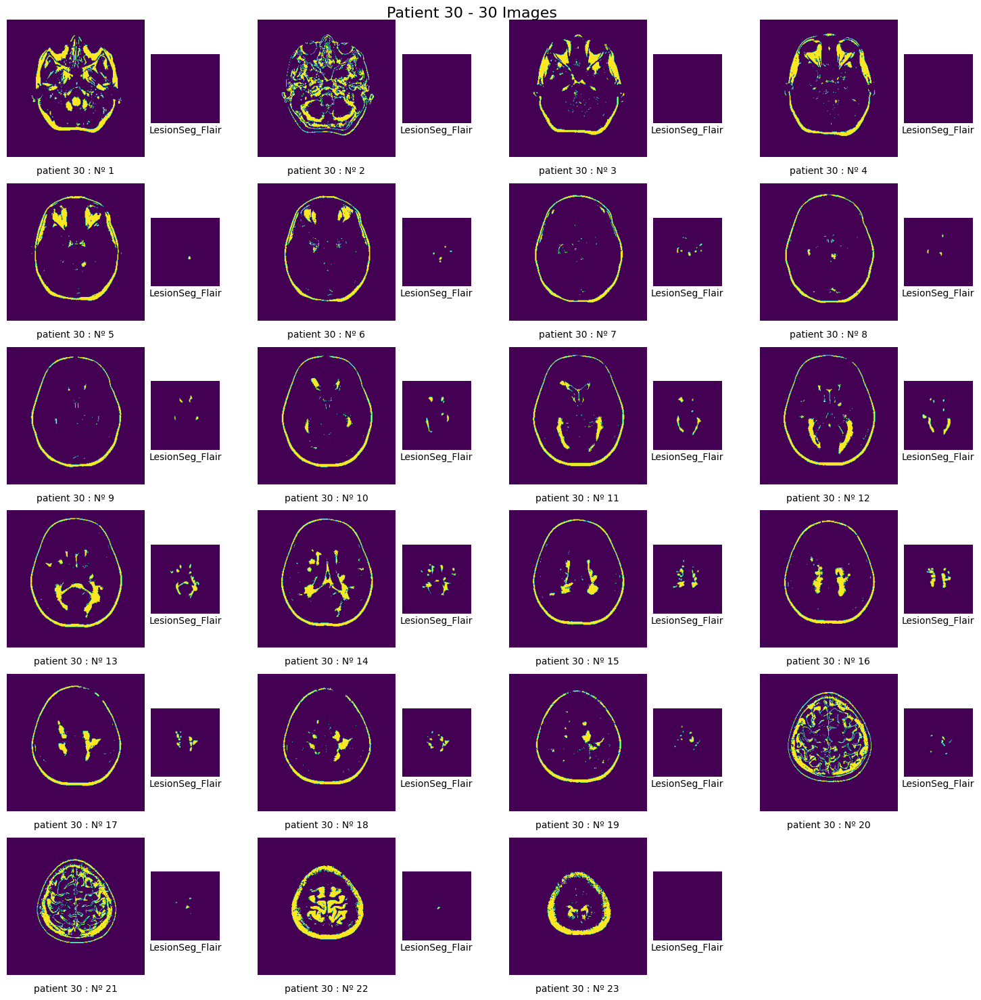

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic
from sklearn.cluster import KMeans
from skimage import color
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Function for K-means clustering segmentation
def kmeans_segmentation(image, n_clusters):
    # Convert the image to a flat 2D array
    data = image.reshape((-1, 1))

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(data)
    segmented_image = kmeans.labels_.reshape(image.shape)

    # Find the smallest cluster
    smallest_cluster_label = np.argmin(np.bincount(kmeans.labels_))

    # Keep only the smallest cluster
    smallest_cluster_mask = (segmented_image == smallest_cluster_label).astype(segmented_image.dtype)

    return smallest_cluster_mask


# Function to compare clustering segmentation to mask
def compare_clustering_to_mask(n, skip_first=0, n_clusters=3):
    test_load = histogram_stretching(Flair(n))

    num_images = test_load.shape[2]
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))
    global mon_mask2
    mon_mask2 = []

    for i in range(test_load.shape[2]):
        row = i // num_columns
        col = i % num_columns

        ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

        if i < skip_first:
            # Show white image with one pixel for skipped frames using a binary colormap
            ax.imshow(np.ones_like(kmeans_segmentation(test_load[:, :, 0], n_clusters)), cmap='viridis')
            mon_mask2.append(np.ones_like(test_load[:, :, 0]))
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

        else:
            a = kmeans_segmentation(histogram_stretching(Flair(n))[:, :, i], n_clusters)
            ax.imshow(a, cmap='viridis')
            mon_mask2.append(a)
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

    for i in range(num_images, num_rows * num_columns):
        row = i // num_columns
        col = i % num_columns
        axes[row, col].axis('off')

    plt.suptitle(f'Patient {n} - {n} Images', va='top', ha='center', fontsize=16)
    plt.tight_layout()
    plt.show()

compare_clustering_to_mask(30)

In [30]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, jaccard_score, recall_score, precision_score

def calculate_metrics(segmented_image, true_mask):
    # Flatten the images to 1D arrays
    segmented_flat = segmented_image.flatten()
    true_flat = true_mask.flatten()

    # Calculate accuracy
    accuracy = accuracy_score(true_flat, segmented_flat)

    # Calculate Jaccard Index (IoU)
    jaccard_index = jaccard_score(true_flat, segmented_flat, average='weighted')

    # Calculate Dice Coefficient
    dice_coefficient = 2 * np.sum(np.logical_and(segmented_flat, true_flat)) / \
                       (np.sum(segmented_flat) + np.sum(true_flat))

    # Calculate recall (Sensibilité)
    recall = recall_score(true_flat, segmented_flat, average='weighted')

    # Calculate precision
    precision = precision_score(true_flat, segmented_flat, average='weighted')

    # Calculate specificity
    true_negative = np.sum(np.logical_and(true_flat == 0, segmented_flat == 0))
    false_positive = np.sum(np.logical_and(true_flat == 0, segmented_flat != 0))
    specificity = true_negative / (true_negative + false_positive)

    # Hausdorff Distance
    # You may need to implement or use a library for this metric, as it's not available in scikit-learn.
    # One option is to use the `scipy.spatial.distance.directed_hausdorff` function.

    # Create a dictionary to store the results
    metrics_dict = {
        'Accuracy': accuracy,
        'Jaccard Index': jaccard_index,
        'Dice Coefficient': dice_coefficient,
        'Sensibilité (Recall)': recall,
        'Précision': precision,
        'Spécificité': specificity,
        # 'Hausdorff Distance': hausdorff_distance,  # Uncomment and provide the actual value
    }

    return metrics_dict

# Example usage:
segmented_image = np.array(mon_mask2)
true_mask = np.array(LesionSeg_Flair(30))

metrics_result2 = calculate_metrics(segmented_image, true_mask)
pd.DataFrame([metrics_result2])

,Accuracy,Jaccard Index,Dice Coefficient,Sensibilité (Recall),Précision,Spécificité
0,0.933644,0.924673,0.012538,0.933644,0.980735,0.942311


## **Segmentation basée sur l’intensité avec clustering (Thresholding / Clustering):**

---






maintenant on doit eliminer la crane de l'image

In [31]:
import cv2 as cv
from sklearn.cluster import DBSCAN

def skull_stripping(image,r):
  # normalization

  #image = np.array(image.dataobj)
  image = image[:,:,r].astype(np.uint16)
  image = cv.normalize(image, None, 0, 255, cv.NORM_MINMAX)
  img = image.copy()


  #median filter
  #image = cv.medianBlur(image.astype(np.uint8),3)

  # get the position of the white-ith pixels and then use dbscan clustring to
  # remove unwanted parts of the image
  i = 0
  j = 0
  l = []
  for i in range(0,256):
    for j in range(0,256):
      if image[i,j] > 20:
        l.append([i,j])
  img_matrix = np.array(l) # position

  # dbscan algorithm
  db=DBSCAN(eps=1,min_samples=1,metric='euclidean')
  db.fit(img_matrix)
  label=db.labels_

  l1 = []
  for k in range(0,100):
    if img_matrix[label==k].shape[0] == 0:
      break
    l1.append(img_matrix[label==k].shape[0])
  max_ = np.array(l1).argmax()

  # remove unwanted parts
  circle = img_matrix[label==max_]

  for i,j in circle:
    image[i,j] = 0
  mask = image == 0

  image =img*mask

  max_int = np.max(np.max(image)) - 30
  print(max_int)

  # thresh_tozero segmentation
  #image = cv.threshold(image,max_int,255,cv.THRESH_TOZERO)[1]

  return image

225


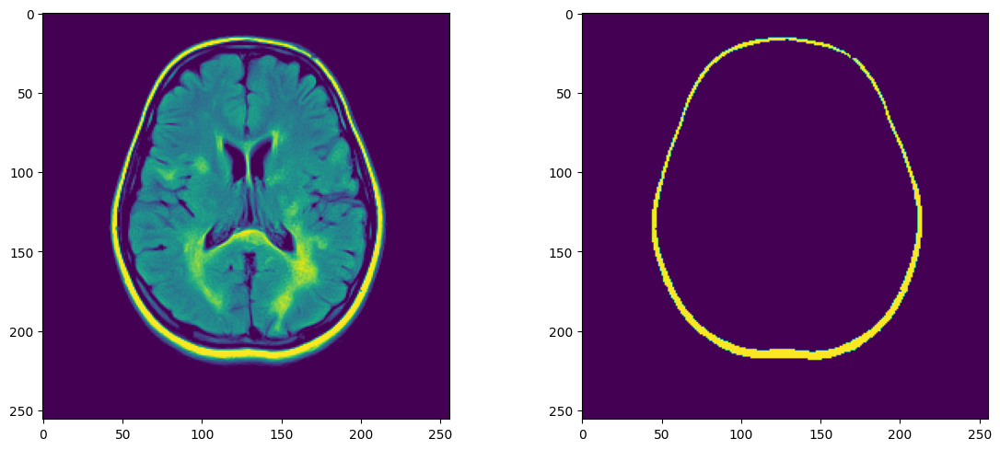

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(histogram_stretching(Flair(30))[:,:,12])
axes[1].imshow(skull_stripping(thresholding_seg(histogram_stretching(Flair(30))),12))

plt.tight_layout()
plt.show()

225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225


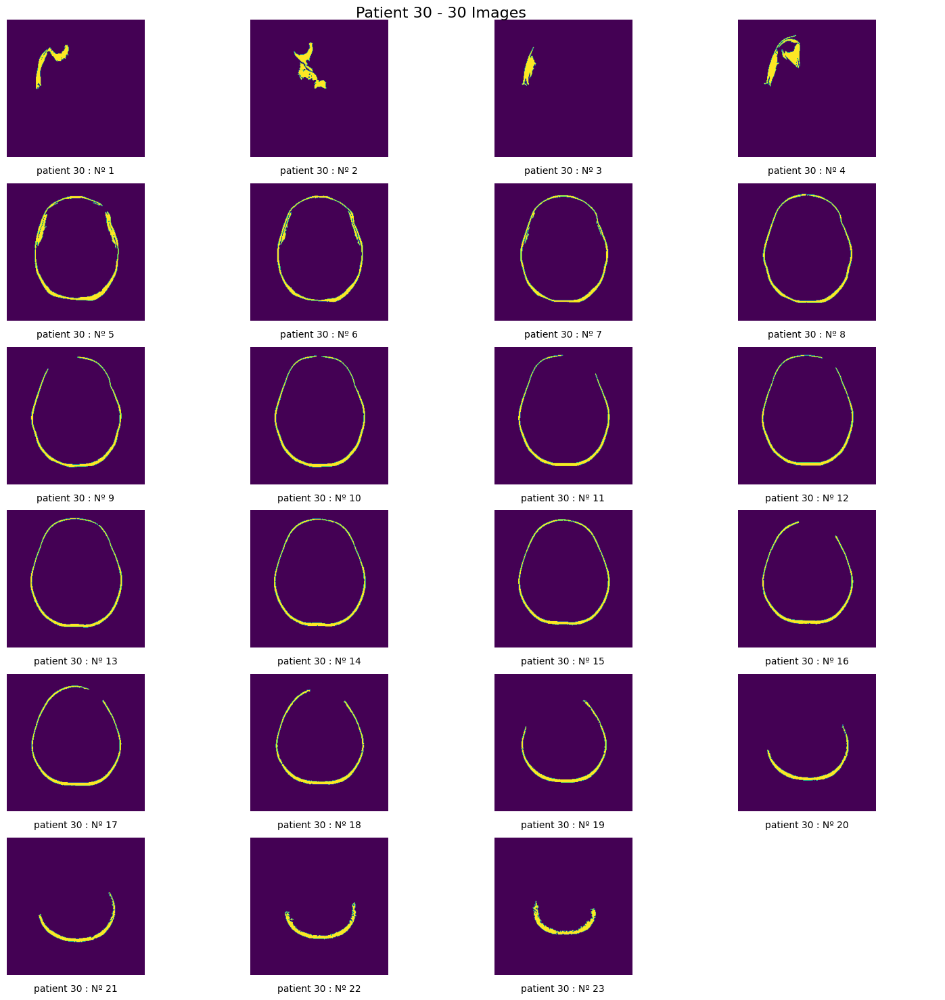

In [52]:
def show_patient_brain_lesion(n):

  test_load = thresholding_seg(histogram_stretching(Flair(n)))

  num_images = test_load.shape[2]
  num_columns = 4
  num_rows = (num_images + num_columns - 1) // num_columns

  fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))

  for i in range(test_load.shape[2]):
      row = i // num_columns
      col = i % num_columns

      ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

      img = thresholding_seg(histogram_stretching(Flair(n))[:,:,i])

      # faire une transformation morphologique de l'image pour se débarasser des points
      #kernel = np.ones((4,4),np.uint8)
      opening = skull_stripping(thresholding_seg(histogram_stretching(Flair(n))), i)

      ax.imshow( opening )
      ax.axis('off')
      ax.text(0.5, -0.1, f'patient {n} : Nº {i+1}', va='center', ha='center', transform=ax.transAxes)

  for i in range(num_images, num_rows * num_columns):
      row = i // num_columns
      col = i % num_columns
      axes[row, col].axis('off')

  plt.suptitle(f'Patient {n} - {n} Images',va='top', ha='center', fontsize=16)
  plt.tight_layout()
  plt.show()

show_patient_brain_lesion(30)

225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225


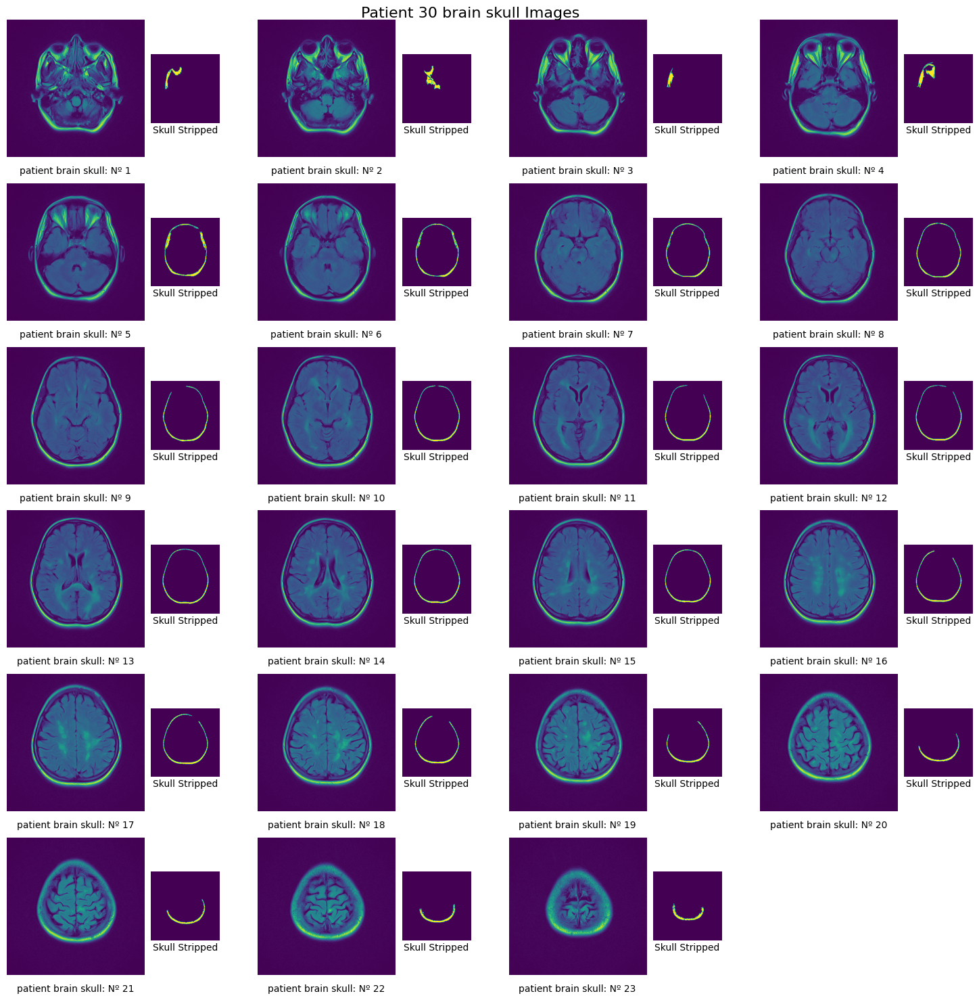

In [33]:
def show_patient_brain_skull1(n):

    test_load = Flair(n)
    num_images = test_load.shape[2]
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))

    for i in range(test_load.shape[2]):
        row = i // num_columns
        col = i % num_columns

        ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

        # Display original image
        ax.imshow(test_load[:, :, i], cmap='viridis')
        ax.axis('off')
        ax.text(0.5, -0.1, f'patient brain skull: Nº {i+1}', va='center', ha='center', transform=ax.transAxes)

        # Display skull-stripped image
        skull_stripped_image = skull_stripping(thresholding_seg(histogram_stretching(Flair(n))), i)
        ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
        ax2.imshow(skull_stripped_image, cmap='viridis')
        ax2.axis('off')
        ax2.text(0.5, -0.1, 'Skull Stripped', va='center', ha='center', transform=ax2.transAxes)

    for i in range(num_images, num_rows * num_columns):
        row = i // num_columns
        col = i % num_columns
        axes[row, col].axis('off')

    plt.suptitle(f'Patient {n} brain skull Images', va='top', ha='center', fontsize=16)
    plt.tight_layout()
    plt.show()

show_patient_brain_skull1(30)

225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225


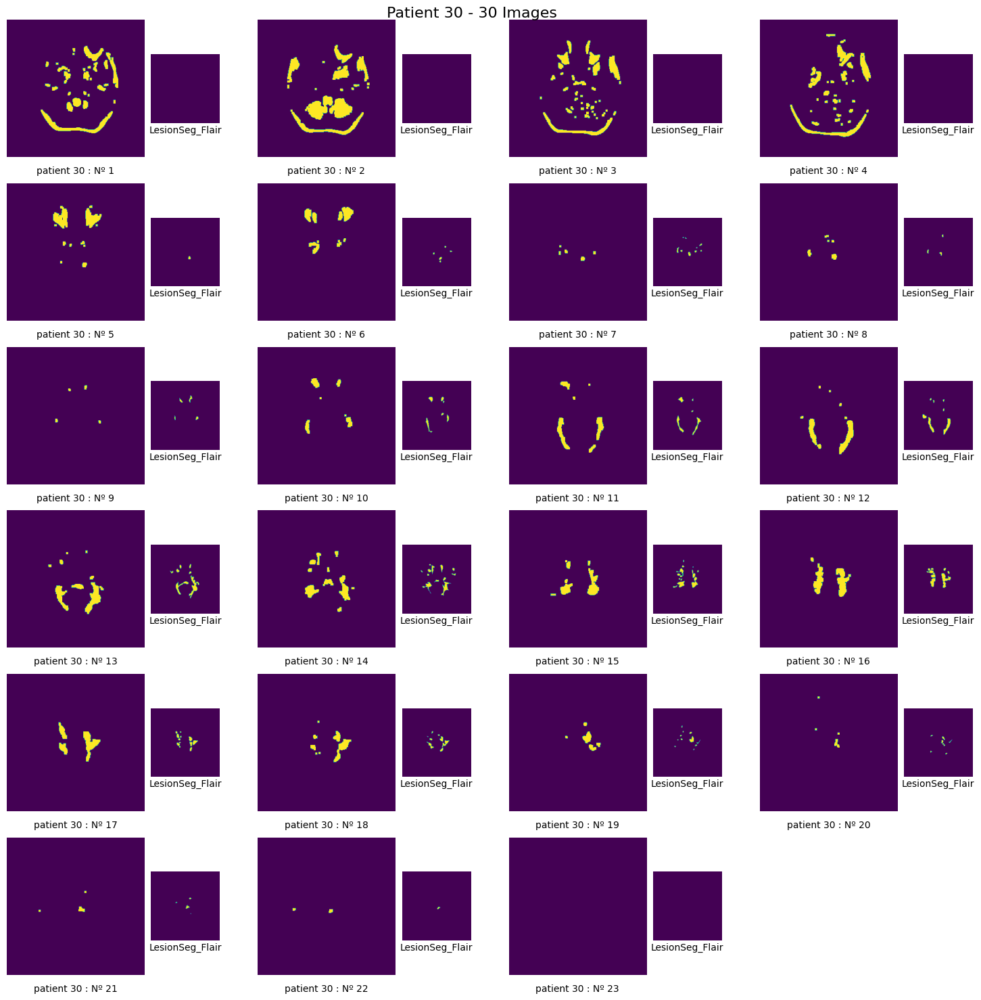

In [34]:
def show_threesholding_on_patient(n):

    test_load = thresholding_seg(histogram_stretching(Flair(n)))

    num_images = test_load.shape[2]
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))

    for i in range(test_load.shape[2]):
        row = i // num_columns
        col = i % num_columns

        ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

        # detection du contours de la crane
        crane = (skull_stripping(test_load, i) > 0).astype(np.uint8)

        # soustraction de la crane de l'image et seg
        a = thresholding_seg(histogram_stretching(Flair(n))[:, :, i] * (1 - crane))

        # faire une transformation morphologique de l'image pour se débarrasser des points
        kernel = np.ones((4, 4), np.uint8)
        opening = cv.morphologyEx(a, cv.MORPH_OPEN, kernel)

        # Add opening image
        ax.imshow(opening, cmap='viridis')
        ax.axis('off')
        ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

        # Add LesionSeg_Flair image
        lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
        ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
        ax2.imshow(lesion_seg_flair, cmap='viridis')
        ax2.axis('off')
        ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

    for i in range(num_images, num_rows * num_columns):
        row = i // num_columns
        col = i % num_columns
        axes[row, col].axis('off')

    plt.suptitle(f'Patient {n} - {n} Images', va='top', ha='center', fontsize=16)
    plt.tight_layout()
    plt.show()

show_threesholding_on_patient(30)

225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225
225


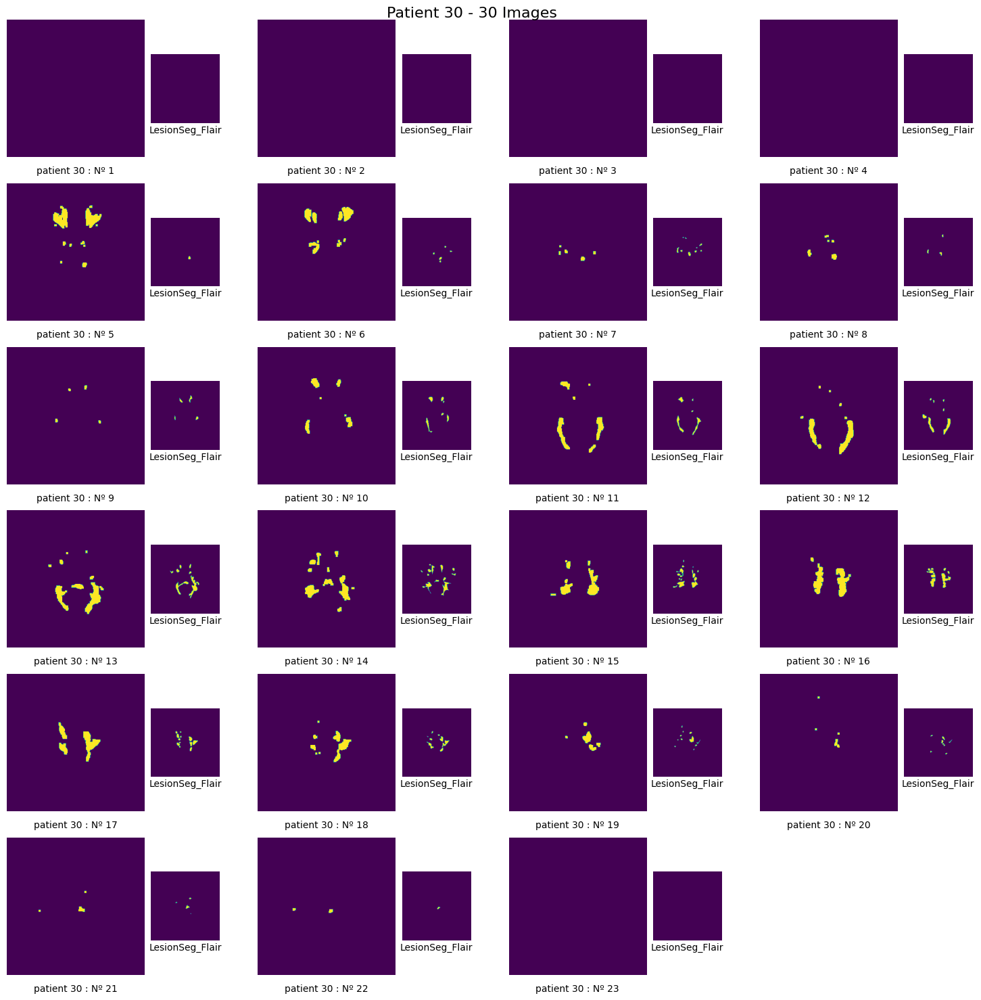

In [35]:
def compare_threesholdingclustering_to_mask(n, skip_first=4):
    test_load = thresholding_seg(histogram_stretching(Flair(n)))

    num_images = test_load.shape[2]
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))
    global mon_mask3
    mon_mask3 = []

    for i in range(test_load.shape[2]):
        row = i // num_columns
        col = i % num_columns

        ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

        if i < skip_first:
            # Show black image for skipped frames
            ax.imshow(np.zeros_like(test_load[:, :, 0]), cmap='viridis')
            mon_mask3.append(np.zeros_like(test_load[:, :, 0]))
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

        else:
            # Continue with the existing processing for subsequent frames

            # detection du contours de la crane
            crane = (skull_stripping(test_load, i) > 0).astype(np.uint8)

            # soustraction de la crane de l'image et seg
            a = thresholding_seg(histogram_stretching(Flair(n))[:, :, i] * (1 - crane))

            # faire une transformation morphologique de l'image pour se débarrasser des points
            kernel = np.ones((4, 4), np.uint8)
            opening = cv.morphologyEx(a, cv.MORPH_OPEN, kernel)

            # Add opening image
            ax.imshow(opening, cmap='viridis')
            mon_mask3.append(opening)
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

    for i in range(num_images, num_rows * num_columns):
        row = i // num_columns
        col = i % num_columns
        axes[row, col].axis('off')

    plt.suptitle(f'Patient {n} - {n} Images', va='top', ha='center', fontsize=16)
    plt.tight_layout()
    plt.show()


compare_threesholdingclustering_to_mask(30)


In [36]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, jaccard_score, recall_score, precision_score

def calculate_metrics(segmented_image, true_mask):
    # Flatten the images to 1D arrays
    segmented_flat = segmented_image.flatten()
    true_flat = true_mask.flatten()

    # Calculate accuracy
    accuracy = accuracy_score(true_flat, segmented_flat)

    # Calculate Jaccard Index (IoU)
    jaccard_index = jaccard_score(true_flat, segmented_flat, average='weighted')

    # Calculate Dice Coefficient
    dice_coefficient = 2 * np.sum(np.logical_and(segmented_flat, true_flat)) / \
                       (np.sum(segmented_flat) + np.sum(true_flat))

    # Calculate recall (Sensibilité)
    recall = recall_score(true_flat, segmented_flat, average='weighted')

    # Calculate precision
    precision = precision_score(true_flat, segmented_flat, average='weighted')

    # Calculate specificity
    true_negative = np.sum(np.logical_and(true_flat == 0, segmented_flat == 0))
    false_positive = np.sum(np.logical_and(true_flat == 0, segmented_flat != 0))
    specificity = true_negative / (true_negative + false_positive)

    # Hausdorff Distance
    # You may need to implement or use a library for this metric, as it's not available in scikit-learn.
    # One option is to use the `scipy.spatial.distance.directed_hausdorff` function.

    # Create a dictionary to store the results
    metrics_dict = {
        'Accuracy': accuracy,
        'Jaccard Index': jaccard_index,
        'Dice Coefficient': dice_coefficient,
        'Sensibilité (Recall)': recall,
        'Précision': precision,
        'Spécificité': specificity,
        # 'Hausdorff Distance': hausdorff_distance,  # Uncomment and provide the actual value
    }

    return metrics_dict

# Example usage:
segmented_image = np.array(mon_mask3)
true_mask = np.array(LesionSeg_Flair(30))

metrics_result3 = calculate_metrics(segmented_image, true_mask)
pd.DataFrame([metrics_result3])

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Accuracy,Jaccard Index,Dice Coefficient,Sensibilité (Recall),Précision,Spécificité
0,0.980509,0.971219,0.000133,0.980509,0.980879,0.990057


## **Segmentation par croissance de région (Region Growing):**

---






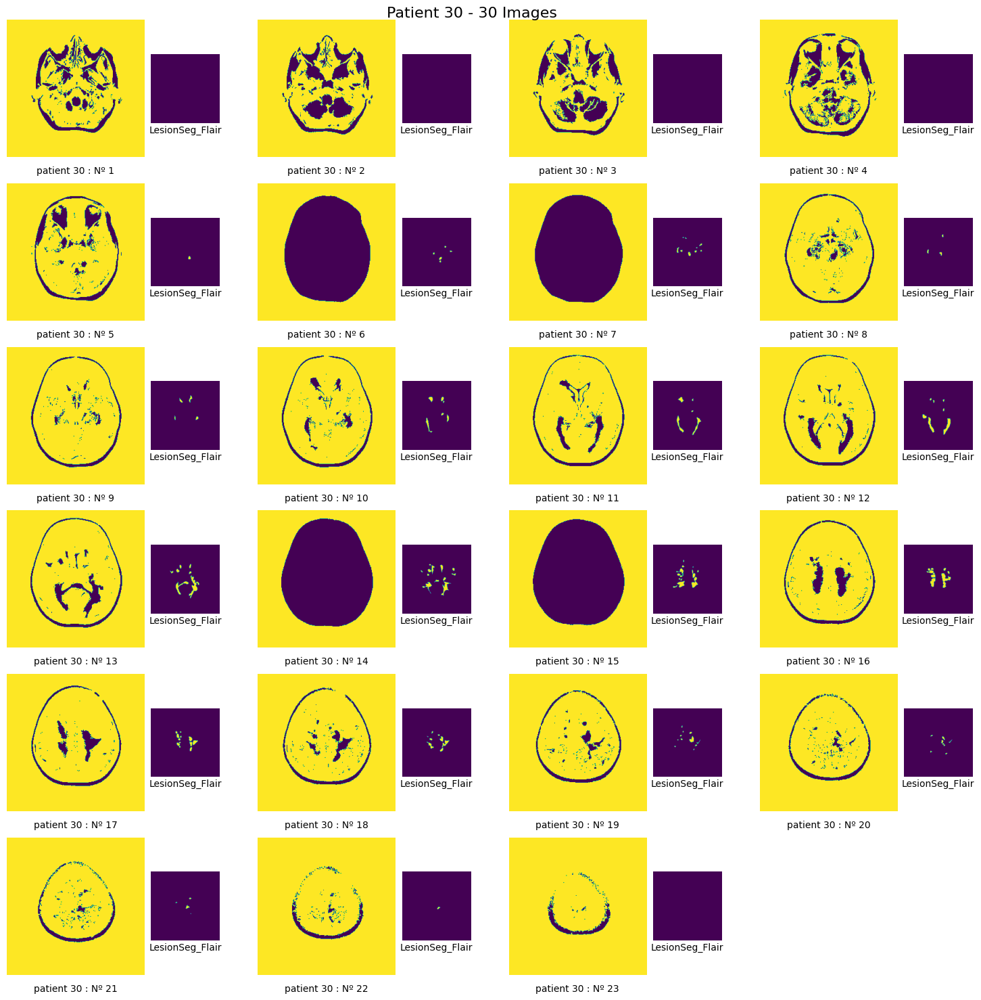

In [37]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

def region_growing(image, seed):
    height, width = image.shape
    segmented = np.zeros_like(image)
    visited = np.zeros_like(image)

    # Define a threshold for region growing (adjust this as needed)
    threshold = 160

    # Stack to keep track of pixels to visit
    stack = [(seed[0], seed[1])]

    while stack:
        x, y = stack.pop()

        # Check if the pixel is within the image boundaries and not visited
        if 0 <= x < height and 0 <= y < width and not visited[x, y]:
            # Check if the pixel intensity difference is below the threshold
            if abs(image[x, y] - image[seed]) < threshold:
                segmented[x, y] = 255
                visited[x, y] = 1

                # Add neighboring pixels to the stack
                stack.append((x + 1, y))
                stack.append((x - 1, y))
                stack.append((x, y + 1))
                stack.append((x, y - 1))

    return segmented


def compare_region_growing_to_mask(n, skip_first=0):   #region growing
    test_load = histogram_stretching(Flair(n))

    num_images = test_load.shape[2]
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))
    global mon_mask4
    mon_mask4 = []

    for i in range(test_load.shape[2]):
        row = i // num_columns
        col = i % num_columns

        ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

        if i < skip_first:
            # Show white image with one pixel for skipped frames
            # Show white image with one pixel for skipped frames using a binary colormap
            ax.imshow(np.ones_like(region_growing(test_load[:, :, 0], (50, 50))), cmap='viridis')
            mon_mask4.append(np.ones_like(test_load[:, :, 0]))
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

        else:

            a = (region_growing((histogram_stretching(Flair(n))[:, :, i]),(50,50)))
            ax.imshow(a, cmap='viridis')
            mon_mask4.append(a)
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

    for i in range(num_images, num_rows * num_columns):
        row = i // num_columns
        col = i % num_columns
        axes[row, col].axis('off')

    plt.suptitle(f'Patient {n} - {n} Images', va='top', ha='center', fontsize=16)
    plt.tight_layout()
    plt.show()

compare_region_growing_to_mask(30)

In [38]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, jaccard_score, recall_score, precision_score

def calculate_metrics(segmented_image, true_mask):
    # Flatten the images to 1D arrays
    segmented_flat = segmented_image.flatten()
    true_flat = true_mask.flatten()

    # Calculate accuracy
    accuracy = accuracy_score(true_flat, segmented_flat)

    # Calculate Jaccard Index (IoU)
    jaccard_index = jaccard_score(true_flat, segmented_flat, average='weighted')

    # Calculate Dice Coefficient
    dice_coefficient = 2 * np.sum(np.logical_and(segmented_flat, true_flat)) / \
                       (np.sum(segmented_flat) + np.sum(true_flat))

    # Calculate recall (Sensibilité)
    recall = recall_score(true_flat, segmented_flat, average='weighted')

    # Calculate precision
    precision = precision_score(true_flat, segmented_flat, average='weighted')

    # Calculate specificity
    true_negative = np.sum(np.logical_and(true_flat == 0, segmented_flat == 0))
    false_positive = np.sum(np.logical_and(true_flat == 0, segmented_flat != 0))
    specificity = true_negative / (true_negative + false_positive)

    # Hausdorff Distance
    # You may need to implement or use a library for this metric, as it's not available in scikit-learn.
    # One option is to use the `scipy.spatial.distance.directed_hausdorff` function.

    # Create a dictionary to store the results
    metrics_dict = {
        'Accuracy': accuracy,
        'Jaccard Index': jaccard_index,
        'Dice Coefficient': dice_coefficient,
        'Sensibilité (Recall)': recall,
        'Précision': precision,
        'Spécificité': specificity,
        # 'Hausdorff Distance': hausdorff_distance,  # Uncomment and provide the actual value
    }

    return metrics_dict

# Example usage:
segmented_image = np.array(mon_mask4)
true_mask = np.array(LesionSeg_Flair(30))

metrics_result4 = calculate_metrics(segmented_image, true_mask)
pd.DataFrame([metrics_result4])

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Accuracy,Jaccard Index,Dice Coefficient,Sensibilité (Recall),Précision,Spécificité
0,0.120182,0.119998,0.000073,0.120182,0.977993,0.121353


## **Segmentation sans prétraitement:**

---

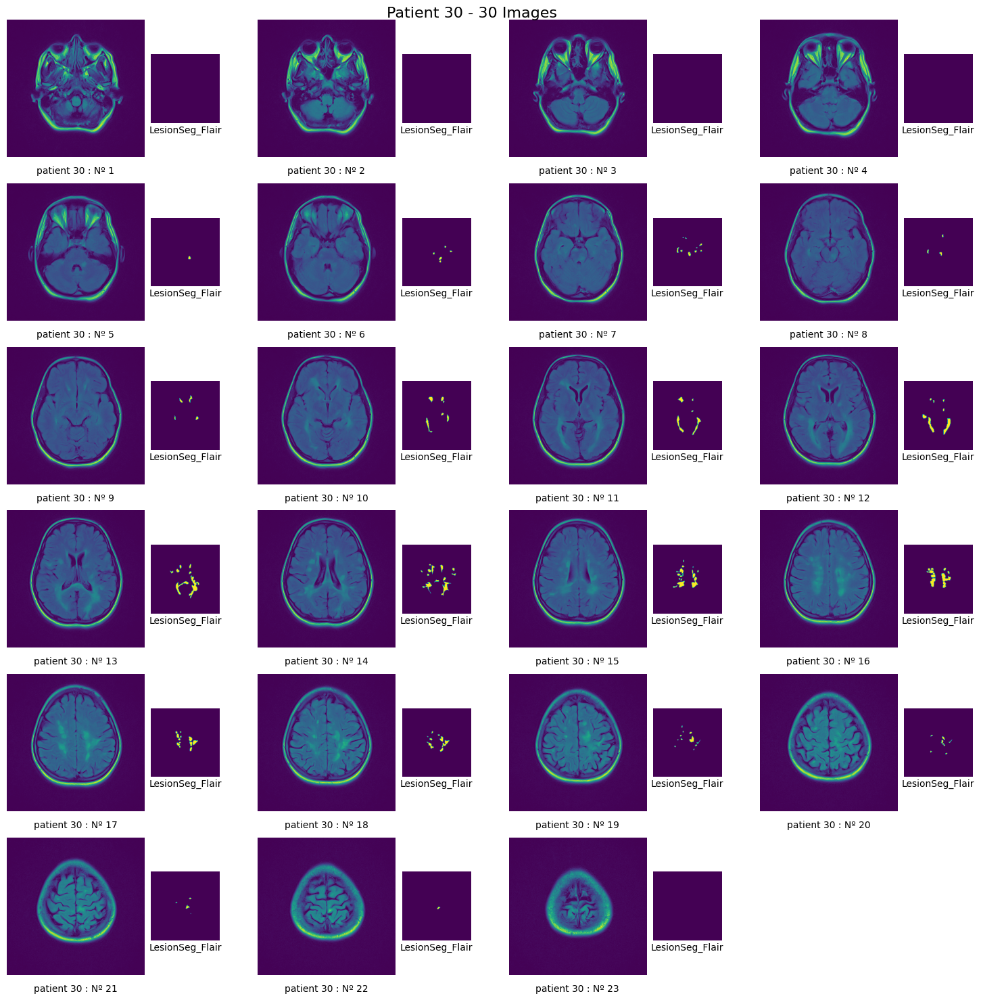

In [39]:
def compare_threesholding_to_mask(n, skip_first=0):
    test_load = Flair(n)

    num_images = test_load.shape[2]
    num_columns = 4
    num_rows = (num_images + num_columns - 1) // num_columns

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 15))
    global mon_mask5
    mon_mask5 = []

    for i in range(test_load.shape[2]):
        row = i // num_columns
        col = i % num_columns

        ax = axes[row, col] if num_rows > 1 else np.atleast_2d(axes[col])

        if i < skip_first:
            # Show black image for skipped frames
            ax.imshow(np.zeros_like(test_load[:, :, 0]), cmap='viridis')
            mon_mask5.append(np.zeros_like(test_load[:, :, 0]))
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

        else:
            # Add opening image
            ax.imshow(test_load[:,:,i], cmap='viridis')
            mon_mask5.append(test_load[:,:,i])
            ax.axis('off')
            ax.text(0.5, -0.1, f'patient {n} : Nº {i + 1}', va='center', ha='center', transform=ax.transAxes)

            # Add LesionSeg_Flair image
            lesion_seg_flair = LesionSeg_Flair(n)[:, :, i]
            ax2 = ax.inset_axes([1.05, 0, 0.5, 1])
            ax2.imshow(lesion_seg_flair, cmap='viridis')
            ax2.axis('off')
            ax2.text(0.5, -0.1, 'LesionSeg_Flair', va='center', ha='center', transform=ax2.transAxes)

    for i in range(num_images, num_rows * num_columns):
        row = i // num_columns
        col = i % num_columns
        axes[row, col].axis('off')

    plt.suptitle(f'Patient {n} - {n} Images', va='top', ha='center', fontsize=16)
    plt.tight_layout()
    plt.show()


compare_threesholding_to_mask(30)


In [40]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, jaccard_score, recall_score, precision_score

def calculate_metrics(segmented_image, true_mask):
    # Flatten the images to 1D arrays
    segmented_flat = segmented_image.flatten()
    true_flat = true_mask.flatten()

    # Calculate accuracy
    accuracy = accuracy_score(true_flat, segmented_flat)

    # Calculate Jaccard Index (IoU)
    jaccard_index = jaccard_score(true_flat, segmented_flat, average='weighted')

    # Calculate Dice Coefficient
    dice_coefficient = 2 * np.sum(np.logical_and(segmented_flat, true_flat)) / \
                       (np.sum(segmented_flat) + np.sum(true_flat))

    # Calculate recall (Sensibilité)
    recall = recall_score(true_flat, segmented_flat, average='weighted')

    # Calculate precision
    precision = precision_score(true_flat, segmented_flat, average='weighted')

    # Calculate specificity
    true_negative = np.sum(np.logical_and(true_flat == 0, segmented_flat == 0))
    false_positive = np.sum(np.logical_and(true_flat == 0, segmented_flat != 0))
    specificity = true_negative / (true_negative + false_positive)

    # Hausdorff Distance
    # You may need to implement or use a library for this metric, as it's not available in scikit-learn.
    # One option is to use the `scipy.spatial.distance.directed_hausdorff` function.

    # Create a dictionary to store the results
    metrics_dict = {
        'Accuracy': accuracy,
        'Jaccard Index': jaccard_index,
        'Dice Coefficient': dice_coefficient,
        'Sensibilité (Recall)': recall,
        'Précision': precision,
        'Spécificité': specificity,
        # 'Hausdorff Distance': hausdorff_distance,  # Uncomment and provide the actual value
    }

    return metrics_dict

# Example usage:
segmented_image = np.array(mon_mask5)
true_mask = np.array(LesionSeg_Flair(30))

metrics_result5 = calculate_metrics(segmented_image, true_mask)
pd.DataFrame([metrics_result5])

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Accuracy,Jaccard Index,Dice Coefficient,Sensibilité (Recall),Précision,Spécificité
0,0.015414,0.015409,0.000189,0.015414,0.979967,0.015545


#Evaluation:
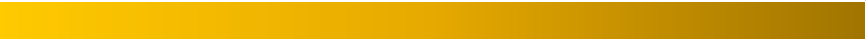



* #### *Résultats Structurés/Tableau*

---


---



In [42]:
import pandas as pd

# Assuming metrics_result1, metrics_result2, etc. are dictionaries with the same keys

# Create a list of your metric results
metrics_results = [metrics_result1, metrics_result2, metrics_result3, metrics_result4, metrics_result5]

# Create a list of row names
row_names = ['thresholding', 'clustering', 'thresholding & clustering', 'Region growing', 'sans pretraitement']

# Create a DataFrame with row names
df = pd.DataFrame(metrics_results, index=row_names)

# Sort the DataFrame by the "accuracy" column in descending order
df_sorted = df.sort_values(by='Accuracy', ascending=False)

# Display the sorted DataFrame
df_sorted

,Accuracy,Jaccard Index,Dice Coefficient,Sensibilité (Recall),Précision,Spécificité
thresholding & clustering,0.980509,0.971219,0.000133,0.980509,0.980879,0.990057
clustering,0.933644,0.924673,0.012538,0.933644,0.980735,0.942311
thresholding,0.928852,0.920364,0.000065,0.928852,0.980712,0.937898
Region growing,0.120182,0.119998,0.000073,0.120182,0.977993,0.121353
sans pretraitement,0.015414,0.015409,0.000189,0.015414,0.979967,0.015545


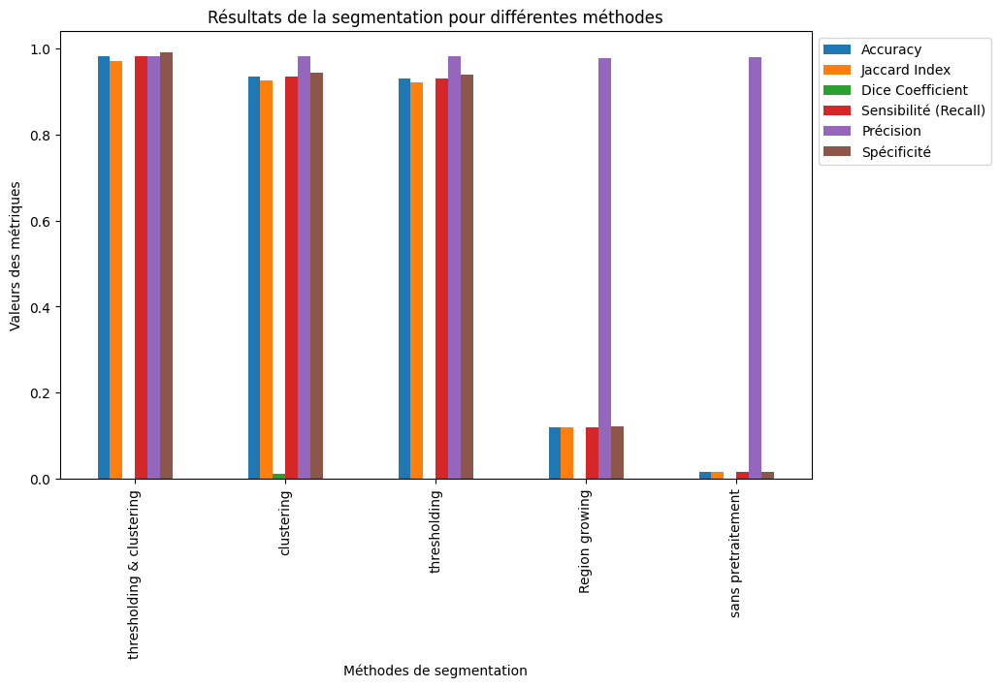

In [43]:
# Créer des graphiques à barres pour chaque métrique
df_sorted.plot(kind='bar', figsize=(10, 6))
plt.title('Résultats de la segmentation pour différentes méthodes')
plt.xlabel('Méthodes de segmentation')
plt.ylabel('Valeurs des métriques')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Afficher le graphique
plt.show()

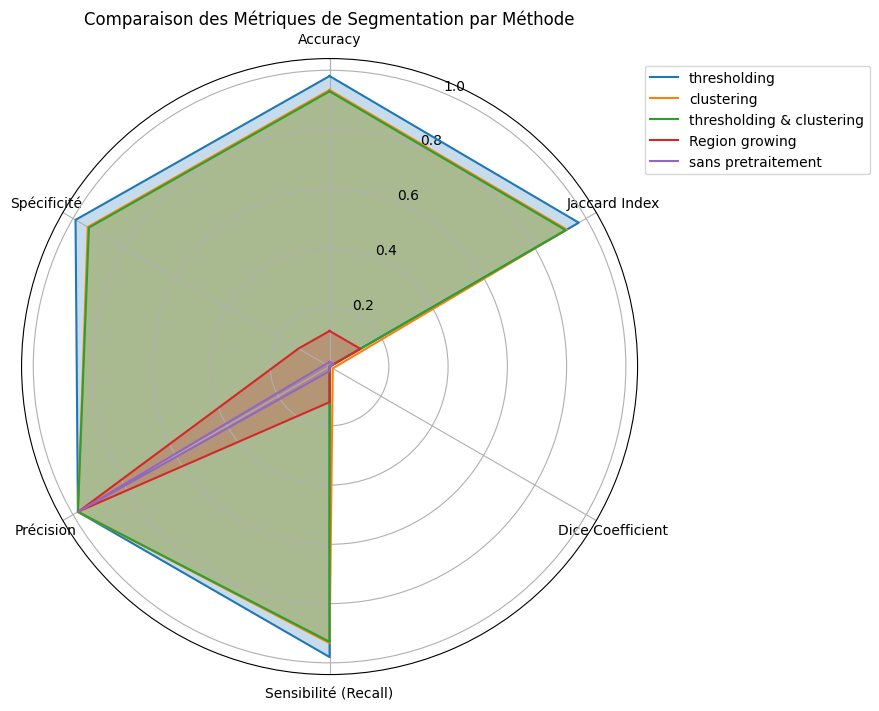

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
from math import pi

# Convertir les données en un format approprié pour le graphique radar
categories=list(df)
N = len(categories)

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

# Initialiser le graphique en radar
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)

# Ploter chaque méthode
for i, method in enumerate(df.index):
    values = df_sorted.iloc[i].tolist()
    values += values[:1]
    ax.plot(angles, values, label=method)
    ax.fill(angles, values, alpha=0.25)

# Ajouter des étiquettes aux axes
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)

# Ajouter une légende
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title('Comparaison des Métriques de Segmentation par Méthode')
plt.show()